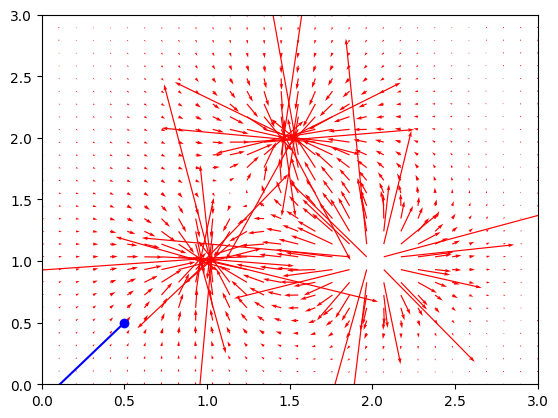

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib import rc

def U(x):
    p1 = np.array([1, 1])
    p2 = np.array([2, 1])
    p3 = np.array([1.5, 2])
    return -1 / np.linalg.norm(x - p1) + 1 / np.linalg.norm(x - p2) - 1 / np.linalg.norm(x - p3)

def gradient_U(x):
    singularities = [np.array([1, 1]), np.array([2, 1]), np.array([1.5, 2])]
    coefficients = [-1, 1, -1]
    gradient = np.zeros(2)
    for p, c in zip(singularities, coefficients):
        delta = x - p
        denominator = np.linalg.norm(delta) ** 3
        gradient += c * delta / denominator
    return gradient

def poisson_flow(x, U):
    return x - gradient_U(x)

def simulate_poisson_flow(x0, U, t_max):
    trajectory = [x0]
    x = x0
    for t in range(1, t_max + 1):
        x = poisson_flow(x, U)
        trajectory.append(x)
    return np.array(trajectory)

def animate_poisson_flow(x0, U, t_max, interval=100):
    trajectory = simulate_poisson_flow(x0, U, t_max)
    fig, ax = plt.subplots()
    X, Y = np.meshgrid(np.linspace(0, 3, 30), np.linspace(0, 3, 30))
    U_vectorized = np.vectorize(lambda x, y: U(np.array([x, y])))
    Z = U_vectorized(X, Y)
    ax.quiver(X, Y, -np.gradient(Z, axis=1), -np.gradient(Z, axis=0), scale=20, color='r')
    line, = ax.plot([], [], 'bo-')
    ax.set_xlim(0, 3)
    ax.set_ylim(0, 3)

    def init():
        line.set_data([], [])
        return line,

    def update(frame):
        line.set_data(trajectory[:frame, 0], trajectory[:frame, 1])
        return line,

    anim = FuncAnimation(fig, update, frames=t_max, init_func=init, interval=interval, blit=True)
    rc('animation', html='jshtml')
    return HTML(anim.to_jshtml())

x0 = np.array([0.5, 0.5])
animate_poisson_flow(x0, U, 100)
